In [1]:
# black code formatting
%load_ext lab_black

# Header

## Import

In [2]:
# -*- coding: UTF-8 -*-
import tensorflow as tf
import tensorflow.keras.backend as K
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import EarlyStopping

import numpy as np
import matplotlib.pyplot as plt

import os
import pickle

from glob import glob
from tqdm import tqdm
import math

import cv2

"""GPU-Setting"""
# os.environ["CUDA_VISIBLE_DEVICES"] = "0,1"
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices("GPU")))

gpus = tf.config.experimental.list_physical_devices("GPU")
if gpus:
    try:
        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices("GPU")
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)

Num GPUs Available:  1
1 Physical GPUs, 1 Logical GPUs


In [3]:
# my global functions

class_names = [
    "gaensebluemchen",
    "hasengloeckchen",
    "krokus",
    "loewenzahn",
    "narzisse",
    "schneegloeckchen",
    "sonnenblume",
]


def get_class_from_id(label_idx):
    switcher = {
        0: class_names[0],
        1: class_names[1],
        2: class_names[2],
        3: class_names[3],
        4: class_names[4],
        5: class_names[5],
        6: class_names[6],
    }
    return switcher.get(label_idx)

## Data

In [4]:
# params
# model
num_filter = 32
dropout = 0.3

# training
img_size = (128, 128)
batch_size = 128
epochs = int(1e9)

In [5]:
# get data paths

img_paths = glob("./data/7flowers_imgs/*.jpg")
img_paths.sort()

img_paths[:3]

['./data/7flowers_imgs/gaensebluemchen_01.jpg',
 './data/7flowers_imgs/gaensebluemchen_02.jpg',
 './data/7flowers_imgs/gaensebluemchen_03.jpg']

In [6]:
# load data

img_list = []
label_list = []

for img_path_tmp in tqdm(img_paths):

    ### IMAGE ###
    img_tmp = plt.imread(img_path_tmp)  # load image
    img_tmp = cv2.resize(src=img_tmp, dsize=img_size)
    assert img_tmp.shape[-1] == 3  # check for grayscale or anomalies
    img_list.append(img_tmp)

    ### LABEL ###
    label_tmp = img_path_tmp.split("/")[-1].split("_")[0]  # get label
    label_list.append(label_tmp)

imgs = np.asarray(img_list)
labels = np.asarray(label_list)
labels = np.expand_dims(labels, axis=-1)

labels[:3]

100%|██████████| 640/640 [00:02<00:00, 268.61it/s]


array([['gaensebluemchen'],
       ['gaensebluemchen'],
       ['gaensebluemchen']], dtype='<U16')

In [7]:
# data check
print("imgs Shape=%s, min=%.3f, max=%.3f" % (imgs.shape, imgs.min(), imgs.max()))
print(f"labels Shape={labels.shape}")

imgs Shape=(640, 128, 128, 3), min=0.000, max=255.000
labels Shape=(640, 1)


In [8]:
# one-hot-encopding labels
from sklearn.preprocessing import OneHotEncoder

my_onehotencoder = OneHotEncoder()
labels = my_onehotencoder.fit_transform(labels).toarray()

for label_tmp in labels:
    # print(label_tmp)
    pass

In [9]:
# normalization
imgs = imgs / 255

In [10]:
# split dataset

# shuffle images and image targets, with same seed so both are shuffled the same way
rnd_int = np.random.randint(123)
np.random.seed(rnd_int)
np.random.shuffle(imgs)
np.random.seed(rnd_int)
np.random.shuffle(labels)

# add first 80% of shuffled and concatenated image data to train data
imgs_train = imgs[: int(0.8 * len(imgs))]
labels_train = labels[: int(0.8 * len(labels))]

# add last 20% of shuffled and concatenated image data to vali data
imgs_val = imgs[int(0.8 * len(imgs)) :]
labels_val = labels[int(0.8 * len(labels)) :]

In [11]:
# data check
print(
    "imgs_train Shape=%s, min=%.3f, max=%.3f"
    % (imgs_train.shape, imgs_train.min(), imgs_train.max())
)
print(
    "labels_train Shape=%s, min=%.3f, max=%.3f"
    % (labels_train.shape, labels_train.min(), labels_train.max())
)
print(
    "imgs_val Shape=%s, min=%.3f, max=%.3f"
    % (imgs_val.shape, imgs_val.min(), imgs_val.max())
)
print(
    "labels_val Shape=%s, min=%.3f, max=%.3f"
    % (labels_val.shape, labels_val.min(), labels_val.max())
)

imgs_train Shape=(512, 128, 128, 3), min=0.000, max=1.000
labels_train Shape=(512, 7), min=0.000, max=1.000
imgs_val Shape=(128, 128, 128, 3), min=0.000, max=1.000
labels_val Shape=(128, 7), min=0.000, max=1.000


In [47]:
# augmentierung

from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    width_shift_range=40,
    height_shift_range=40,
    shear_range=32.0,
    rotation_range=180,
    brightness_range=[0.2, 2],
    zoom_range=[0.5, 2],
    rescale=1.0 / 255.0,  # normalization
    fill_mode="nearest",
)
aug_iterator = datagen.flow(
    (imgs_train * 255).astype("uint8"),
    (labels_train).astype("uint8"),
    batch_size=batch_size,
)  # 'dis'-normalization for ImageDataGenerator processing

samples_per_epoche = imgs_train.shape[0] // batch_size
samples_per_epoche

4

class: krokus


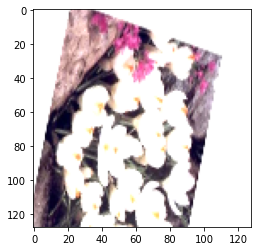

In [51]:
batch = next(aug_iterator)

idx = np.random.randint(len(batch[0]))
img_tmp = batch[0][idx]
class_tmp = batch[1][idx].argmax()
print(f"class: {get_class_from_id(class_tmp)}")

plt.close()
plt.figure(figsize=(4, 4), facecolor="w")
plt.imshow((img_tmp * 255).astype("uint8"), "gray")
plt.show()

In [40]:
# data check
sample_imgs_train, sample_labels_train = next(aug_iterator)
sample_img_val, sample_labels_val = (imgs_val, labels_val)

print(
    "sample_imgs_train Shape=%s, min=%.3f, max=%.3f"
    % (sample_imgs_train.shape, sample_imgs_train.min(), sample_imgs_train.max())
)
print(
    "sample_labels_train Shape=%s, min=%.3f, max=%.3f"
    % (sample_labels_train.shape, sample_labels_train.min(), sample_labels_train.max())
)
print(
    "sample_img_val Shape=%s, min=%.3f, max=%.3f"
    % (sample_img_val.shape, sample_img_val.min(), sample_img_val.max())
)
print(
    "sample_labels_val Shape=%s, min=%.3f, max=%.3f"
    % (sample_labels_val.shape, sample_labels_val.min(), sample_labels_val.max())
)

sample_imgs_train Shape=(128, 128, 128, 3), min=0.000, max=1.000
sample_labels_train Shape=(128, 7), min=0.000, max=1.000
sample_img_val Shape=(128, 128, 128, 3), min=0.000, max=1.000
sample_labels_val Shape=(128, 7), min=0.000, max=1.000


## Visio

<Figure size 432x288 with 0 Axes>

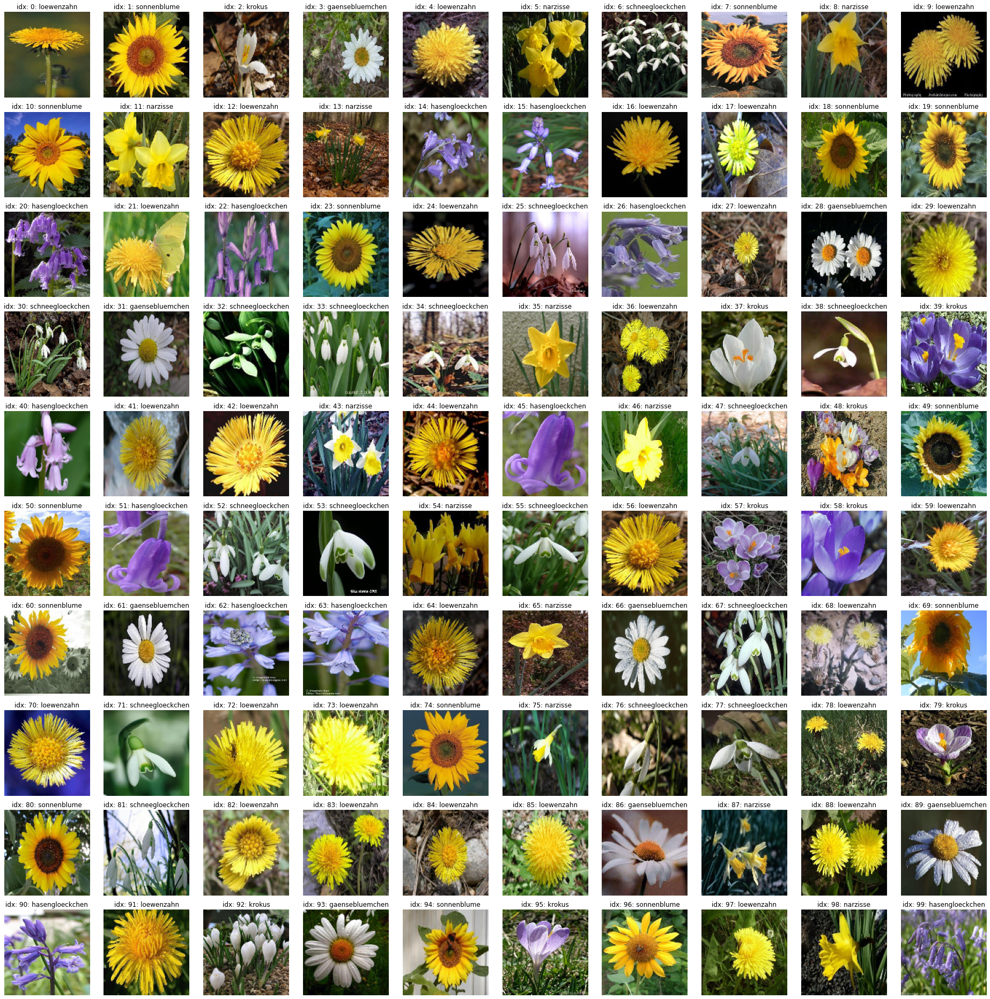

In [41]:
# shuffle images and image targets, with same seed so both are shuffled the same way
np.random.seed(42)
np.random.shuffle(imgs_val)
np.random.seed(42)
np.random.shuffle(labels_val)

plt.close()
plt.clf()
fig = plt.figure(figsize=(26, 26))
for idx in range(100):
    class_tmp = get_class_from_id(np.argmax(labels_val[idx]))
    ax1 = plt.subplot(10, 10, idx + 1)
    plt.title(f"idx: {idx}: {class_tmp}")
    plt.imshow(imgs_val[idx], "gray")
    ax1.axis("off")
plt.tight_layout()
plt.show()

## CNN Model

In [42]:
# keras import
from keras.optimizers import Adam
from keras.datasets import cifar10
from keras.models import Sequential
from keras.layers import Dropout, Dense, Flatten
from keras.layers.convolutional import Conv2D, MaxPooling2D

In [43]:
# parameters
input_shape = imgs_train[0].shape
num_classes = 7

# keras sequential model
model = Sequential(name="flowers_cnn")
# conv2D-layer
model.add(
    Conv2D(
        num_filter, (3, 3), input_shape=input_shape, padding="same", activation="relu"
    )
)
model.add(Dropout(dropout))
model.add(Conv2D(num_filter, (3, 3), activation="relu", padding="same"))
model.add(MaxPooling2D(pool_size=(4, 4)))
model.add(Dropout(dropout))
model.add(Conv2D(num_filter, (3, 3), activation="relu", padding="same"))
model.add(MaxPooling2D(pool_size=(4, 4)))

# dense-layer
model.add(Flatten())
model.add(Dense(512, activation="relu"))
model.add(Dropout(dropout))
model.add(Dense(num_classes, activation="softmax"))

# compile model
opt = Adam(learning_rate=0.0001)

model.compile(
    loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"],
)

model.summary()

Model: "flowers_cnn"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 128, 128, 32)      896       
_________________________________________________________________
dropout_4 (Dropout)          (None, 128, 128, 32)      0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 128, 128, 32)      9248      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 32, 32, 32)        0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 32, 32, 32)        9248      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 8, 8, 32)          

### Training

In [44]:
# params
verbose = 1

es = EarlyStopping(monitor="val_loss", mode="min", verbose=verbose, patience=50)

hist = model.fit(
    aug_iterator,
    validation_data=(imgs_val, labels_val),
    epochs=epochs,
    verbose=verbose,
    callbacks=[es],
)

Epoch 1/1000000000
4/4 [==============================] - 2s 502ms/step - loss: 1.9853 - accuracy: 0.1895 - val_loss: 1.9076 - val_accuracy: 0.2812
Epoch 2/1000000000
4/4 [==============================] - 2s 423ms/step - loss: 1.9749 - accuracy: 0.2188 - val_loss: 1.9050 - val_accuracy: 0.2812
Epoch 3/1000000000
4/4 [==============================] - 2s 415ms/step - loss: 1.8825 - accuracy: 0.2578 - val_loss: 1.9083 - val_accuracy: 0.2891
Epoch 4/1000000000
4/4 [==============================] - 2s 427ms/step - loss: 1.9181 - accuracy: 0.2520 - val_loss: 1.9033 - val_accuracy: 0.3047
Epoch 5/1000000000
4/4 [==============================] - 2s 425ms/step - loss: 1.8647 - accuracy: 0.2969 - val_loss: 1.8927 - val_accuracy: 0.3438
Epoch 6/1000000000
4/4 [==============================] - 2s 432ms/step - loss: 1.8664 - accuracy: 0.2910 - val_loss: 1.8807 - val_accuracy: 0.4141
Epoch 7/1000000000
4/4 [==============================] - 2s 401ms/step - loss: 1.8497 - accuracy: 0.3047 - val_

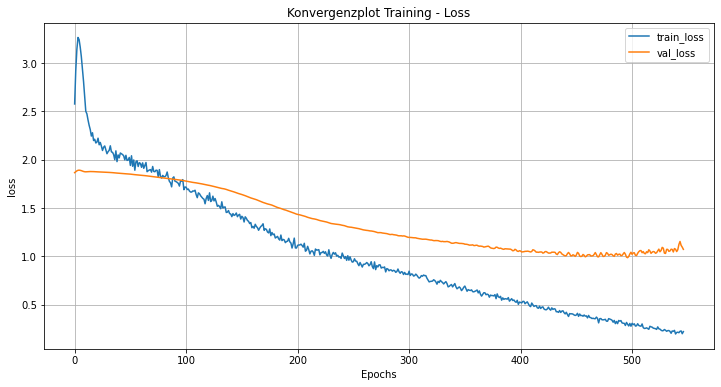

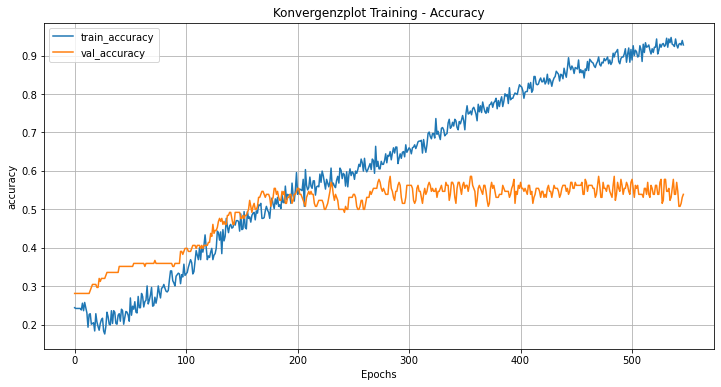

In [27]:
# loss
plt.close()
fig = plt.figure(figsize=(12, 6))
plt.plot(hist.history["loss"], label="train_loss")
plt.plot(hist.history["val_loss"], label="val_loss")
plt.title("Konvergenzplot Training - Loss")
plt.xlabel("Epochs")
plt.ylabel("loss")
plt.grid()
plt.legend()
plt.show()

# accuracy
plt.close()
fig = plt.figure(figsize=(12, 6))
plt.plot(hist.history["accuracy"], label="train_accuracy")
plt.plot(hist.history["val_accuracy"], label="val_accuracy")
plt.title("Konvergenzplot Training - Accuracy")
plt.xlabel("Epochs")
plt.ylabel("accuracy")
plt.grid()
plt.legend()
plt.show()

## Evaluation

In [28]:
# get predictions

preds_val = model.predict(imgs_val, batch_size=16)

print(
    "preds_val Shape=%s, min=%.3f, max=%.3f\n"
    % (preds_val.shape, preds_val.min(), preds_val.max())
)
print(f"{preds_val[0]}\n")
print(f"{get_class_from_id(preds_val[0].argmax())}")

preds_val Shape=(128, 7), min=0.000, max=0.999

[0.07048641 0.10703093 0.50104606 0.00828544 0.01804053 0.29298043
 0.00213028]

krokus


In [29]:
from sklearn import metrics

accuracy = metrics.accuracy_score(labels_val.argmax(axis=-1), preds_val.argmax(axis=-1))

accuracy

0.5390625

In [30]:
from sklearn.metrics import classification_report

print(
    classification_report(
        labels_val.argmax(axis=-1), preds_val.argmax(axis=-1), target_names=class_names
    )
)

                  precision    recall  f1-score   support

 gaensebluemchen       0.75      0.90      0.82        10
 hasengloeckchen       0.87      0.65      0.74        20
          krokus       0.28      0.67      0.39        12
      loewenzahn       0.65      0.42      0.51        36
        narzisse       0.36      0.33      0.34        15
schneegloeckchen       1.00      0.11      0.20        18
     sonnenblume       0.52      1.00      0.68        17

        accuracy                           0.54       128
       macro avg       0.63      0.58      0.53       128
    weighted avg       0.65      0.54      0.52       128



In [31]:
counter_true = 0
counter_false = 0

for label_val, pred_val in zip(labels_val, preds_val):
    label_class = label_val.argmax(axis=-1)
    pred_class = pred_val.argmax(axis=-1)
    if label_class == pred_class:
        counter_true += 1
    else:
        counter_false += 1

print(f"counter_true: {counter_true}")
print(f"counter_false: {counter_false}")
print(f"ratio: {round((counter_true/(counter_true + counter_false)),4)}")

counter_true: 69
counter_false: 59
ratio: 0.5391


<Figure size 432x288 with 0 Axes>

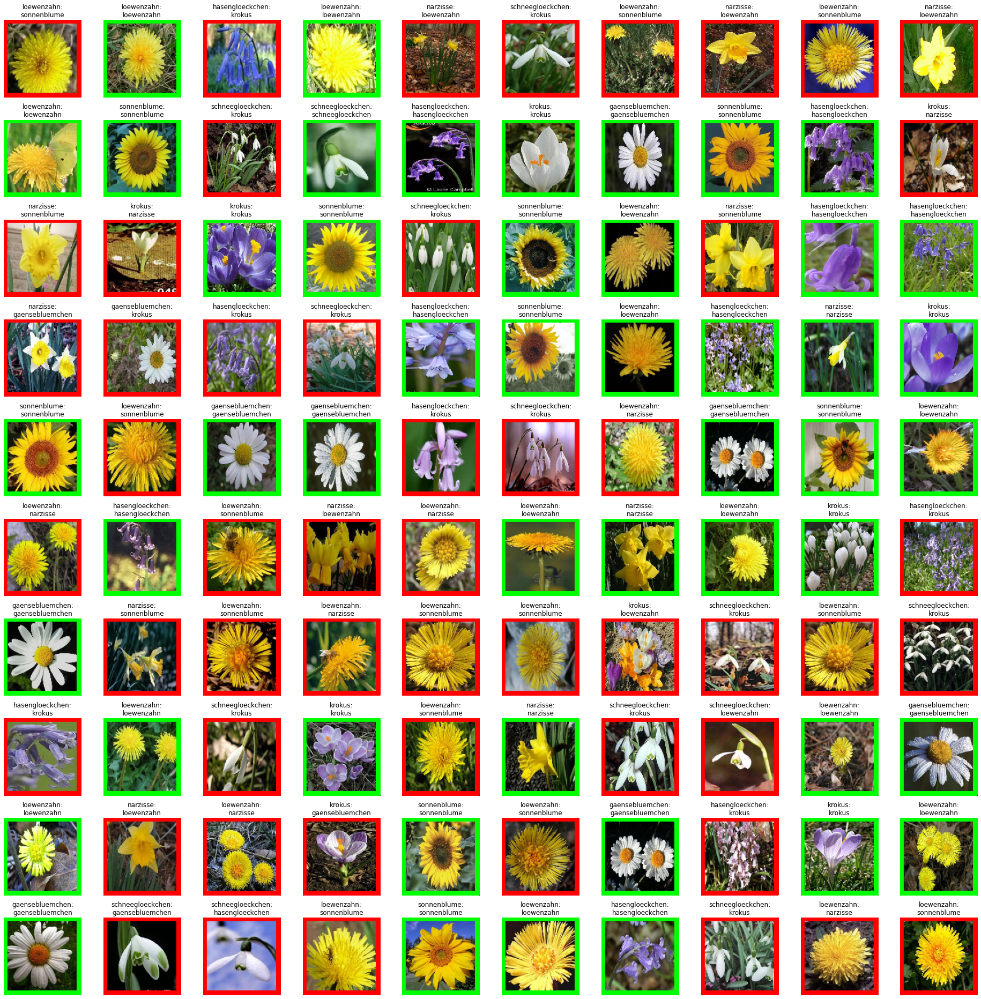

In [35]:
# shuffle images and image targets, with same seed so both are shuffled the same way
np.random.seed(42)
np.random.shuffle(imgs_val)
np.random.seed(42)
np.random.shuffle(labels_val)
np.random.seed(42)
np.random.shuffle(preds_val)


plt.close()
plt.clf()
fig = plt.figure(figsize=(26, 26))
for idx in range(100):
    class_label_tmp = get_class_from_id(np.argmax(labels_val[idx]))
    class_pred_tmp = get_class_from_id(np.argmax(preds_val[idx]))
    ax1 = plt.subplot(10, 10, idx + 1)
    plt.title(f"{class_label_tmp}:\n{class_pred_tmp}")
    # draw rectangle
    img_tmp = (imgs_val[idx] * 255).astype("uint8")
    thickness = 8
    if np.argmax(labels_val[idx]) == np.argmax(preds_val[idx]):
        COLOR = (0, 255, 0)
    else:
        COLOR = (255, 0, 0)
    img_tmp = cv2.rectangle(
        img_tmp,
        (1, 1),
        (
            img_size[0] + int(thickness / 2) - thickness,
            img_size[1] + int(thickness / 2) - thickness,
        ),
        COLOR,
        thickness,
    )
    plt.imshow(img_tmp, "gray")
    ax1.axis("off")
plt.tight_layout()
plt.show()